In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import polars as pl
import seaborn as sns

from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

# AII

In [2]:
keywords = [
    'machine learning',
    'deep learning',
    'artificial intelligence',
    'reinforcement learning',
    'neural network',
    # 'image recognition',
    'computer vision',
    'natural language processing',
    # 'model training',
    # 'inference',
    # 'hyperparameter',
    'speech processing',
    'control methods',
    'knowledge representation',
    'planning',
    'predictive analytics',
    'robotics',
]

In [3]:
patents = pd.read_csv('datasets/ai_patents.csv').drop('index', axis=1)
patents['year'] = patents['publication_date'].astype(str).str[:4].astype(int)
patents.head()

,publication_number,application_number,publication_date,title,abstract,code,year
0,US-8756170-B2,US-201113115400-A,20140617,Regular expression matching method and system,The present invention discloses a regex matchi...,G06N99/005,2014
1,US-2016364537-A1,US-201514740255-A,20161215,Diagnostic support systems using machine learn...,Systems for diagnostic decision support utiliz...,A61B5/7267,2016
2,US-2017103055-A1,US-201615362590-A,20170413,Patent drafting system,Systems and methods are disclosed to analyze a...,G06F17/27,2017
3,US-2017166204-A1,US-201615240504-A,20170615,Method and apparatus for controlling path of a...,A method for controlling a path of an autonomo...,G05D1/0088,2017
4,US-2017168485-A1,US-201514968848-A,20170615,System and Method for Controlling Autonomous V...,A method determines iteratively a motion of th...,G05D1/0088,2017


In [4]:
from sklearn.feature_extraction.text import CountVectorizer

vec = CountVectorizer(lowercase=True, ngram_range=(1, 3), vocabulary=keywords, binary=True)
X = vec.fit_transform(patents.abstract.values)

In [184]:
total = pd.DataFrame({
    'keywords': keywords,
    'freq': np.array(X.sum(axis=0)).flatten()
})
print(
    total.set_index('keywords')
    .sort_values('freq', ascending=False)
    .style.to_latex()
)

\begin{tabular}{lr}
 & freq \\
keywords &  \\
machine learning & 10904 \\
neural network & 9364 \\
artificial intelligence & 2674 \\
deep learning & 1848 \\
planning & 1050 \\
natural language processing & 917 \\
reinforcement learning & 506 \\
computer vision & 463 \\
speech processing & 126 \\
predictive analytics & 69 \\
robotics & 64 \\
control methods & 29 \\
knowledge representation & 24 \\
\end{tabular}



In [6]:
(X.sum(axis=1) != 0).sum(axis=0)

matrix([[25283]])

In [7]:
# model = SentenceTransformer('sentence-transformers/sentence-t5-xl')

In [8]:
# pool = model.start_multi_process_pool()
# abstract_embeddings = model.encode_multi_process(patents.abstract.values, pool)
# model.stop_multi_process_pool(pool)
# np.save('datasets/abstract_embeddings_t5-xl.npy')

In [9]:
patent_mask = (np.array(X.sum(axis=1)) != 0).flatten()
patents = patents[patent_mask].reset_index(drop=True).copy()

In [10]:
abstract_embeddings = np.load('datasets/abstract_embeddings_t5-xl.npy')
abstract_embeddings = abstract_embeddings[patent_mask].copy()

In [11]:
assert patents.shape[0] == abstract_embeddings.shape[0]

In [12]:
task_ratings = pd.read_csv('datasets/db_26_3_text/Task Ratings.txt', sep='\t').query('`Scale ID` == "IM"')
task_statements = pd.read_csv('datasets/db_26_3_text/Task Statements.txt', sep='\t')
jobs = pd.read_csv('datasets/db_26_3_text/Occupation Data.txt', sep='\t')
jobs['SOC Code'] = jobs['O*NET-SOC Code'].str[:7]

In [13]:
tasks = pd.merge(
    task_ratings,
    task_statements[['O*NET-SOC Code', 'Task ID', 'Task']],
    how='left',
    on=['O*NET-SOC Code', 'Task ID']
)

In [14]:
tasks.shape

(17879, 13)

In [15]:
# task_embeddings = model.encode(tasks['Task'].values)
# np.save('datasets/task_embeddings_t5.npy', task_embeddings)
task_embeddings = np.load('datasets/task_embeddings_26_3.npy')

In [16]:
def compute_scores(task_embeddings, abstract_embeddings, tasks, jobs, aioe=None, threshold=0.8):
    similarity = cosine_similarity(
        task_embeddings,
        abstract_embeddings
    )

    task_df = tasks.copy()

    # threshold = task_df['similarity'].quantile(.95)
    task_df['similarity'] = similarity.max(axis=1)
    task_df['patent_index'] = similarity.argmax(axis=1)
    # task_df['weight'] = task_df['Data Value'] / task_df.groupby('O*NET-SOC Code')['Data Value'].transform('sum')
    # task_df['similarity_t'] = task_df['similarity'] * (task_df['similarity'] > threshold).astype(int)
    # task_df['aii'] = task_df['similarity'] * task_df['weight']
    task_df['aii'] = task_df['similarity'].gt(threshold)

    jobs_aii = pd.merge(
        task_df.groupby('O*NET-SOC Code').agg({'aii': 'mean'}).reset_index(),
        jobs,
        how='left',
        on='O*NET-SOC Code'
    )

    if aioe is not None:
        data = pd.merge(
            jobs_aii.groupby('SOC Code').aii.mean().reset_index(),
            aioe,
            how='left',
            on='SOC Code'
        ).rename({'AIOE': 'aioe'}, axis=1)

        return data
    else:
        return jobs_aii

In [17]:
similarity = cosine_similarity(
    task_embeddings,
    abstract_embeddings[patents[patents['year'].ge(2015)].index]
)

In [18]:
print(f"Tasks: {similarity.shape[0]:,.0f}")
print(f"Patents: {similarity.shape[1]:,.0f}")

Tasks: 17,879
Patents: 24,758


/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Conver

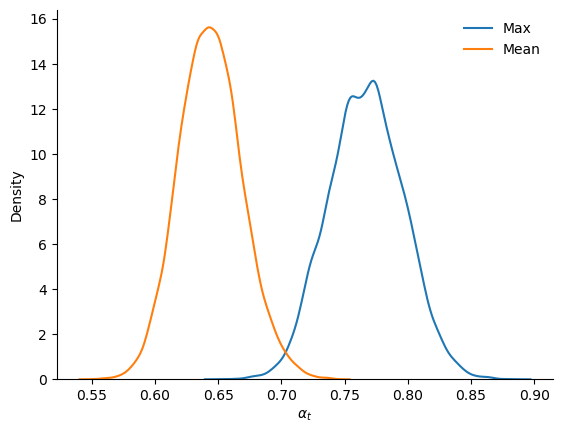

In [19]:
sns.kdeplot(x=similarity.max(axis=1))
sns.kdeplot(x=similarity.mean(axis=1))
# sns.histplot(x=similarity.flatten(), bins=30, alpha=.5, stat='density')
plt.legend(['Max', 'Mean'], frameon=False)
plt.xlabel('$\\alpha_t$')
sns.despine()
plt.savefig('figures/2022/similarity-dist.pdf', bbox_inches='tight')

In [20]:
p_threshold = .90

tasks['similarity'] = similarity.max(axis=1)
tasks['patent_index'] = similarity.argmax(axis=1)
# tasks['weight'] = tasks['Data Value'] / tasks.groupby('O*NET-SOC Code')['Data Value'].transform('sum')
tasks['similarity_t'] = tasks['similarity'] * (tasks['similarity'] > tasks['similarity'].quantile(p_threshold)).astype(int)
tasks['s'] = tasks['similarity'].gt(tasks['similarity'].quantile(p_threshold))
# tasks['aii'] = tasks['similarity'] * tasks['weight']

In [21]:
print(f"Similarity threshold: {tasks['similarity'].quantile(p_threshold):.2f}")

Similarity threshold: 0.80


In [217]:
np.mean(similarity), np.std(similarity)

(0.6440125, 0.034800947)

In [220]:
np.mean(similarity.max(axis=1)), np.std(similarity.max(axis=1))

(0.7669628, 0.02945845)

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



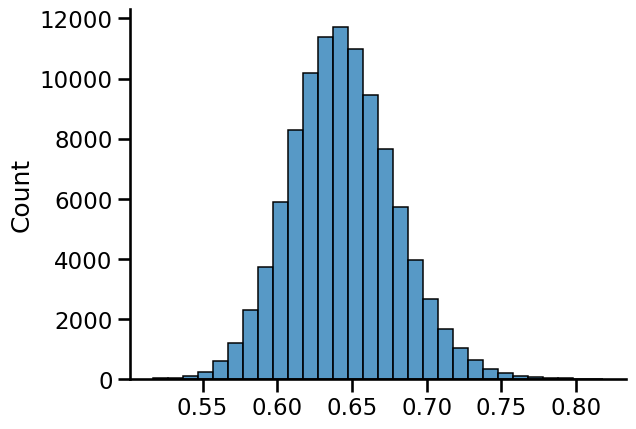

In [214]:
# sns.histplot(x=np.random.choice(similarity.flatten(), 100_000, replace=False), bins=30)
# sns.despine()
# plt.savefig('figures/2022/all-similarity.pdf', bbox_inches='tight')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


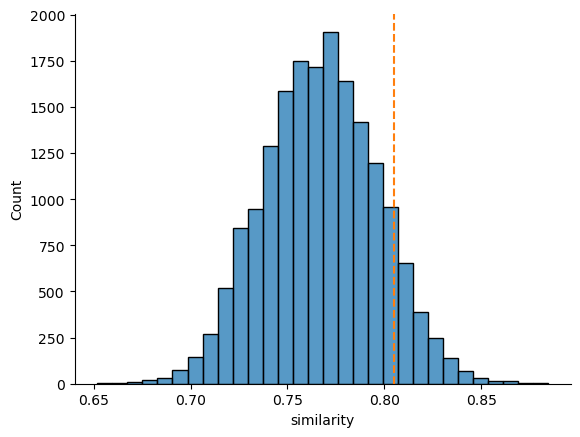

In [22]:
sns.histplot(x=tasks['similarity'], bins=30)
plt.axvline(tasks['similarity'].quantile(p_threshold), linestyle='--', c='C1')
sns.despine()

In [23]:
jobs_aii = (
    pl.from_dataframe(tasks)
    .group_by('O*NET-SOC Code')
    .agg(
        # pl.col('aii').sum(),
        pl.col('s').mean().alias('aii'),
        pl.col('s').sum().alias('nb_impacted_tasks'),
        pl.col('s').count().alias('total_tasks'),
    )
    # .agg(pl.col('s').mean().alias('aii'))
    .join(
        pl.from_dataframe(jobs),
        how='left',
        on='O*NET-SOC Code'
    )
    .to_pandas()
    .sort_values('O*NET-SOC Code')
)
jobs_aii['aii'] = jobs_aii['nb_impacted_tasks'] / jobs_aii['total_tasks']

In [24]:
jobs_aii.to_csv('datasets/2022/jobs_aii.csv')

In [25]:
aioe = pd.read_excel('datasets/AIOE_DataAppendix.xlsx', sheet_name='Appendix A')

In [26]:
# Joining the data with AIOE for comparison
data = (
    (
        pl.from_dataframe(jobs_aii)
        .group_by('SOC Code')
        .agg(
            pl.col('nb_impacted_tasks').sum(),
            pl.col('total_tasks').sum(),
            pl.col('Title').first(),
        )
        .with_columns(
            pl.col('nb_impacted_tasks').truediv(pl.col('total_tasks')).alias('aii')
        )
    )
    .join(
        pl.from_dataframe(aioe),
        how='left',
        on='SOC Code'
    )
    .to_pandas()
).rename({'AIOE': 'aioe'}, axis=1)

In [27]:
data.drop('Occupation Title', axis=1).to_csv('datasets/2022/aii.csv', index=False)

In [226]:
data[data['Title'].str.contains('Dredge Operators')]

,SOC Code,nb_impacted_tasks,total_tasks,Title,aii,Occupation Title,aioe,mu_aii,sigma_aii,occ_group
11,53-7031,0,6,Dredge Operators,0.0,Dredge Operators,-1.016648,0.125,0.11024,53


/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


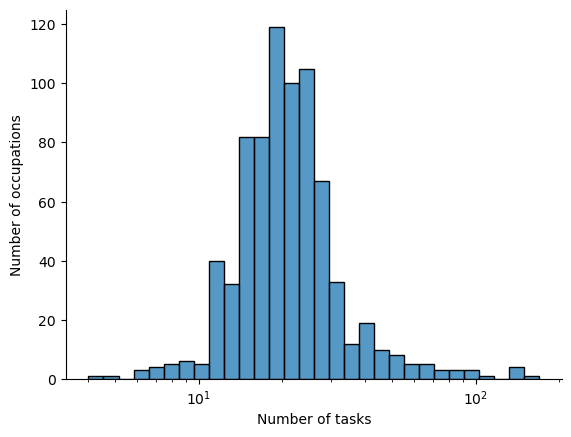

In [28]:
# Fig. S1
sns.histplot(x=data['total_tasks'], bins=30, log_scale=True)
plt.xlabel('Number of tasks')
plt.ylabel('Number of occupations')
sns.despine()
plt.savefig('figures/2022/task-histogram.pdf', bbox_inches='tight')

In [29]:
data['total_tasks'].describe()

count    759.000000
mean      23.555995
std       15.530011
min        4.000000
25%       16.000000
50%       20.000000
75%       26.000000
max      170.000000
Name: total_tasks, dtype: float64

In [30]:
tasks['SOC Code'] = tasks['O*NET-SOC Code'].str.slice(0, 7)

In [31]:
tasks[tasks['SOC Code'].eq('33-9032')].sort_values('similarity', ascending=False)[['Task', 'similarity']].style.format('{:.2f}', subset='similarity')

,Task,similarity
9792,Operate detecting devices to screen individuals and prevent passage of prohibited articles into restricted areas.,0.86
9795,"Monitor and adjust controls that regulate building systems, such as air conditioning, furnace, or boiler.",0.83
9782,Lock doors and gates of entrances and exits to secure buildings.,0.82
9793,"Inspect and adjust security systems, equipment, or machinery to ensure operational use and to detect evidence of tampering.",0.81
9787,"Call police or fire departments in cases of emergency, such as fire or presence of unauthorized persons.",0.81
9784,"Monitor and authorize entrance and departure of employees, visitors, and other persons to guard against theft and maintain security of premises.",0.81
9794,Escort or drive motor vehicle to transport individuals to specified locations or to provide personal protection.,0.80
9783,Answer alarms and investigate disturbances.,0.80
9786,"Patrol industrial or commercial premises to prevent and detect signs of intrusion and ensure security of doors, windows, and gates.",0.80
9788,Respond to medical emergencies by administering basic first aid or by obtaining assistance from paramedics.,0.77


In [32]:
pd.DataFrame({
    'Highest scoring': data.nlargest(20, ['aii', 'total_tasks'])['Title'].reset_index(drop=True),
    'Lowest scoring': data.nsmallest(20, ['aii', 'total_tasks'])['Title'].reset_index(drop=True),
})

,Highest scoring,Lowest scoring
0,Cardiovascular Technologists and Technicians,Pile Driver Operators
1,Sound Engineering Technicians,Dredge Operators
2,Nuclear Medicine Technologists,Aircraft Cargo Handling Supervisors
3,Air Traffic Controllers,"Graders and Sorters, Agricultural Products"
4,Magnetic Resonance Imaging Technologists,Insurance Underwriters
5,Electro-Mechanical and Mechatronics Technologi...,Floor Sanders and Finishers
6,Orthodontists,Reinforcing Iron and Rebar Workers
7,Power Distributors and Dispatchers,Farm Labor Contractors
8,Neurologists,Administrative Services Managers
9,Industrial Truck and Tractor Operators,"Rock Splitters, Quarry"


In [33]:
# Table 1
print(pd.DataFrame({
    'Highest scoring': data.nlargest(20, ['aii', 'total_tasks'])['Title'].reset_index(drop=True),
    'Lowest scoring': data.nsmallest(20, ['aii', 'total_tasks'])['Title'].reset_index(drop=True),
}).style.to_latex())

\begin{tabular}{lll}
 & Highest scoring & Lowest scoring \\
0 & Cardiovascular Technologists and Technicians & Pile Driver Operators \\
1 & Sound Engineering Technicians & Dredge Operators \\
2 & Nuclear Medicine Technologists & Aircraft Cargo Handling Supervisors \\
3 & Air Traffic Controllers & Graders and Sorters, Agricultural Products \\
4 & Magnetic Resonance Imaging Technologists & Insurance Underwriters \\
5 & Electro-Mechanical and Mechatronics Technologists and Technicians & Floor Sanders and Finishers \\
6 & Orthodontists & Reinforcing Iron and Rebar Workers \\
7 & Power Distributors and Dispatchers & Farm Labor Contractors \\
8 & Neurologists & Administrative Services Managers \\
9 & Industrial Truck and Tractor Operators & Rock Splitters, Quarry \\
10 & Public Safety Telecommunicators & Brokerage Clerks \\
11 & Computer Numerically Controlled Tool Programmers & Podiatrists \\
12 & Security Guards & Helpers--Painters, Paperhangers, Plasterers, and Stucco Masons \\
13 & Remot

In [34]:
patent_map = patents[patents['year'].ge(2015) & patents['year'].le(2022)].title.reset_index(drop=True).to_dict()
patent_abstract_map = patents[patents['year'].ge(2015) & patents['year'].le(2022)].abstract.reset_index(drop=True).to_dict()
job_ids = data.nlargest(20, ['aii', 'total_tasks'])['SOC Code'].tolist()
# job_ids = data.sort_values(['aii', 'total_tasks'], ascending=False).reset_index(drop=True).iloc[np.arange(377, 397)]['SOC Code'].tolist()
top_tasks = (
    pl.from_dataframe(tasks)
    .filter(pl.col('SOC Code').is_in(job_ids))
    .sort('similarity')
    .group_by('SOC Code')
    .tail(1)
    .join(
        pl.from_dataframe(data),
        how='left',
        on='SOC Code'
    )
    .sort(['aii', 'total_tasks'], descending=True)
    .select('SOC Code', 'Title', 'Task', 'patent_index', 'similarity', 'nb_impacted_tasks', 'total_tasks')
    .to_pandas()
)

top_tasks['patent'] = top_tasks['patent_index'].map(patent_map)

top_patents = top_tasks['patent_index'].tolist()
top_patents = tasks[tasks['patent_index'].isin(top_patents)].groupby('patent_index').agg({
    'SOC Code': ['count', pd.Series.nunique]
})
top_patents.columns = ['nb_tasks', 'nb_jobs']

top_tasks = top_tasks.merge(
    top_patents,
    how='left',
    left_on='patent_index',
    right_index=True
)

In [35]:
pd.options.display.max_colwidth = 100

In [39]:
from scipy.stats import beta

data['mu_aii'] = data.apply(lambda x: beta(1 + x['nb_impacted_tasks'], 1 + x['total_tasks'] - x['nb_impacted_tasks']).mean(), axis=1)
data['sigma_aii'] = data.apply(lambda x: beta(1 + x['nb_impacted_tasks'], 1 + x['total_tasks'] - x['nb_impacted_tasks']).std(), axis=1)

In [40]:
data['occ_group'] = data['SOC Code'].str.slice(0, 2)

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


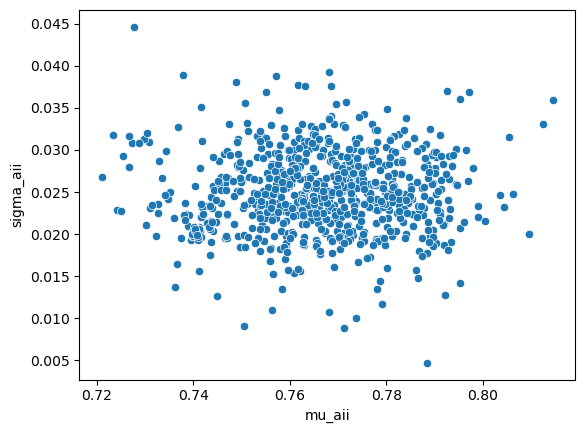

In [42]:
aii = tasks.groupby('SOC Code').agg({
    'similarity': ['mean', 'std']
})
aii.columns = ['mu_aii', 'sigma_aii']

sns.scatterplot(
    x='mu_aii',
    y='sigma_aii',
    # hue='occ_group',
    data=aii,
    # palette='tab20',
    legend=False,
);

In [196]:
# Table S6
zero_webb_ids = [
    18295,
    19801,
    18280
]
zero_webb_table = tasks[tasks['Task ID'].isin(zero_webb_ids)].copy()
zero_webb_table['abstract'] = zero_webb_table['patent_index'].map(patent_abstract_map)
zero_webb_table[['Task', 'abstract', 'similarity']]

,Task,abstract,similarity
4514,Document and maintain records of precision agriculture information.,A method and system for predicting soil and/or plant condition in precision agriculture with a c...,0.790070
4516,Apply precision agriculture information to specifically reduce the negative environmental impact...,A method and system for predicting soil and/or plant condition in precision agriculture with a c...,0.813330
4519,"Install, calibrate, or maintain sensors, mechanical controls, GPS-based vehicle guidance systems...",A vehicle computing system validates location data received from a Global Navigation Satellite S...,0.817376


# Trends

In [43]:
occupations = pl.read_csv('datasets/db_26_3_text/Occupation Level Metadata.txt', separator='\t')

In [44]:
df = pd.DataFrame()
for year in range(2015, 2023):
    temp_df = compute_scores(
        task_embeddings,
        abstract_embeddings[patents.query('2015 <= year <= @year').index],
        tasks,
        jobs,
        aioe
    )
    temp_df['year'] = year
    df = pd.concat([df, temp_df], ignore_index=True)

In [45]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

trends = []
for code, group in df.groupby('SOC Code'):
    reg = LinearRegression()
    support = np.arange(len(group)).reshape(-1, 1)
    y = group['aii']
    reg.fit(support, y)
    y_pred = reg.predict(support)
    r2 = r2_score(y, y_pred)
    trends.append({
        'SOC Code': code,
        'slope': reg.coef_[0],
        'difference': group['aii'].max() - group['aii'].min(),
        'aii': group['aii'].max(),
        'r2': r2,
    })
trends = pd.DataFrame(trends)

In [46]:
trends['difference'].describe(percentiles=[0.25, 0.5, 0.75, 0.9])

count    759.000000
mean       0.117952
std        0.120617
min        0.000000
25%        0.000000
50%        0.080000
75%        0.187500
90%        0.294118
max        0.600000
Name: difference, dtype: float64

In [47]:
t = trends.query('difference != 0').difference.median()
trends['group'] = np.select(
    [trends['difference'] == 0, trends['difference'] <= t],
    [0, 1],
    2
)

# trends['group'] = pd.qcut(trends['difference'], 3).cat.codes

In [48]:
threshold = tasks['similarity'].quantile(p_threshold)

def find_most_disrupted_tasks(task_embeddings, abstract_embeddings, tasks, patents):
    assert task_embeddings.shape[0] == tasks.shape[0]
    assert abstract_embeddings.shape[0] == patents.shape[0]

    similarity = cosine_similarity(
        task_embeddings,
        abstract_embeddings
    )

    task_df = tasks.copy()

    patent_map = patents.abstract.reset_index(drop=True).to_dict()
    task_df['similarity'] = similarity.max(axis=1)
    task_df['patent_index'] = similarity.argmax(axis=1)
    task_df['s'] = task_df['similarity'].gt(threshold).astype(int)
    task_df['similarity_t'] = task_df['similarity'] * task_df['s']
    task_df['closest_patent'] = task_df['patent_index'].map(patent_map)
    return task_df

In [159]:
disrupted_tasks = pd.DataFrame()

for year in range(2015, 2023):
    # soc_codes = bumps[bumps['year'].eq(year)]['SOC Code'].values
    # task_ids = tasks[tasks['SOC Code'].isin(soc_codes)].index.values
    task_ids = tasks[tasks['SOC Code'].isin(job_ids)].index.values
    patent_ids = patents[patents['year'].ge(2015) & patents['year'].le(year)].index.values

    disrupted_tasks = pd.concat([
        disrupted_tasks,
        (
            pl.from_dataframe(
                find_most_disrupted_tasks(
                    task_embeddings[task_ids],
                    abstract_embeddings[patent_ids],
                    tasks.loc[task_ids],
                    patents.loc[patent_ids],
                )
            )
            .filter(pl.col('s').eq(1))
            .select(
                'SOC Code',
                pl.col('Task').alias('task'),
                pl.col('closest_patent').alias('patent'),
                'similarity',
                's',
                pl.lit(year, dtype=int).alias('year')
            )
            .to_pandas()
        )
    ], ignore_index=True)

In [164]:
sector_map = {
    '29-2035': 'Health care and social assistance',
    '15-1132': 'Information',
    '27-4014': 'Information',
    '15-1131': 'Information',
    '19-4099': 'Information',
    '19-2099': 'Information',
    '17-3024': 'Information',
}

job_sectors = (
    occupations
    .filter(pl.col('Item').eq('NAICS Sector'))
    .filter(pl.col('Percent').ne('n/a'))
    .filter(pl.col('Percent').cast(float).ge(50))
    .with_columns(
        pl.col('O*NET-SOC Code').str.slice(0, 7).alias('SOC Code')
    )
    .filter(pl.col('SOC Code').is_in(disrupted_tasks['SOC Code'].unique().tolist()))
    .join(pl.from_dataframe(data), on='SOC Code')
    .select(
        'SOC Code',
        pl.col('Response').alias('sector'),
    )
    .to_pandas()
)

job_sectors = data.nlargest(20, 'aii').merge(
    job_sectors,
    how='left',
    on='SOC Code'
)

job_sectors['sector'] = job_sectors['sector'].fillna(job_sectors['SOC Code'].map(sector_map))
job_sectors.loc[job_sectors['SOC Code'].eq('19-4099'), 'sector'] = 'Information'
job_sectors.loc[job_sectors['SOC Code'].eq('53-2011'), 'sector'] = 'Information'
job_sectors.loc[job_sectors['SOC Code'].eq('47-5021'), 'sector'] = 'Manufacturing'
job_sectors.loc[job_sectors['SOC Code'].eq('53-2021'), 'sector'] = 'Information'
job_sectors.loc[job_sectors['SOC Code'].eq('51-8012'), 'sector'] = 'Manufacturing'
job_sectors.loc[job_sectors['SOC Code'].eq('33-9032'), 'sector'] = 'Manufacturing'
job_sectors.loc[job_sectors['SOC Code'].eq('19-2021'), 'sector'] = 'Information'
job_sectors.loc[job_sectors['SOC Code'].eq('27-4013'), 'sector'] = 'Information'
job_sectors.loc[job_sectors['SOC Code'].eq('51-6063'), 'sector'] = 'Manufacturing'
job_sectors.loc[job_sectors['SOC Code'].eq('43-5031'), 'sector'] = 'Information'

In [165]:
job_sectors.drop('Occupation Title', axis=1).sort_values('sector')

,SOC Code,nb_impacted_tasks,total_tasks,Title,aii,aioe,mu_aii,sigma_aii,occ_group,sector
0,29-2031,16,25,Cardiovascular Technologists and Technicians,0.640000,-0.090953,0.629630,0.091260,29,Health care and social assistance
2,29-2033,9,17,Nuclear Medicine Technologists,0.529412,0.085528,0.526316,0.111648,29,Health care and social assistance
4,29-2035,12,23,Magnetic Resonance Imaging Technologists,0.521739,-0.072763,0.520000,0.097980,29,Health care and social assistance
6,29-1023,5,10,Orthodontists,0.500000,0.161663,0.500000,0.138675,29,Health care and social assistance
8,29-1217,11,24,Neurologists,0.458333,NaN,0.461538,0.095940,29,Health care and social assistance
18,31-9094,6,15,Medical Transcriptionists,0.400000,1.062590,0.411765,0.116002,31,Health care and social assistance
15,29-1224,7,17,Radiologists,0.411765,NaN,0.421053,0.110401,29,Health care and social assistance
1,27-4014,8,14,Sound Engineering Technicians,0.571429,0.471546,0.562500,0.120317,27,Information
3,53-2021,12,23,Air Traffic Controllers,0.521739,1.152798,0.520000,0.097980,53,Information
16,19-2021,11,27,Atmospheric and Space Scientists,0.407407,1.373917,0.413793,0.089920,19,Information


In [52]:
short_title_map = {
    'Orthodontists': 'Orthodontists',
    'Neurologists': 'Neurologists',
    'Radiologists': 'Radiologists',
    'Cardiovascular Technologists and Technicians': 'Cardiovascular Technologists',
    'Nuclear Medicine Technologists': 'Nuclear Medicine Technologists',
    'Magnetic Resonance Imaging Technologists': 'MRI Technologists',
    'Medical Transcriptionists': 'Medical Transcriptionists',
    'Atmospheric and Space Scientists': 'Atmospheric and Space Scientists',
    'Remote Sensing Scientists and Technologists': 'Remote Sensing Scientists',
    'Sound Engineering Technicians': 'Sound Engineering Technicians',
    'Public Safety Telecommunicators': 'Public Safety Telecommunicators',
    'Air Traffic Controllers': 'Air Traffic Controllers',
    'Electro-Mechanical and Mechatronics Technologists and Technicians': 'Electro-Mechanical Technologists',
    'Security Guards': 'Security Guards',
    'Machinists': 'Machinists',
    'Textile Knitting and Weaving Machine Setters, Operators, and Tenders': 'Textile Machine Operators',
    'Power Distributors and Dispatchers': 'Power Distributors and Dispatchers',
    'Computer Numerically Controlled Tool Operators': 'Computer Numerically Controlled Tool Operators',
    'Computer Numerically Controlled Tool Programmers': 'Computer Numerically Controlled Tool Programmers',
    'Industrial Truck and Tractor Operators': 'Industrial Truck and Tractor Operators',
}

In [53]:
(
    pl.from_dataframe(disrupted_tasks)
    .join(
        pl.from_dataframe(data),
        on='SOC Code'
    )
    .pivot(
        index='year',
        columns='Title',
        values='task',
        aggregate_function='count',
    )
    .fill_null(0)
    .select(pl.all().exclude('year').diff())
)

Electro-Mechanical and Mechatronics Technologists and Technicians,Atmospheric and Space Scientists,Orthodontists,Neurologists,Radiologists,Cardiovascular Technologists and Technicians,Nuclear Medicine Technologists,Power Distributors and Dispatchers,Air Traffic Controllers,Remote Sensing Scientists and Technologists,Sound Engineering Technicians,Magnetic Resonance Imaging Technologists,Public Safety Telecommunicators,Computer Numerically Controlled Tool Operators,Computer Numerically Controlled Tool Programmers,Industrial Truck and Tractor Operators,Medical Transcriptionists,Machinists,"Textile Knitting and Weaving Machine Setters, Operators, and Tenders",Security Guards
i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64
null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
0,4,0,3,2,6,0,1,0,1,1,3,2,1,3,1,0,0,0,0
4,4,0,1,2,1,2,0,0,4,0,4,0,1,0,0,3,4,1,0
0,0,2,3,1,0,0,1,0,1,1,0,0,2,2,1,3,0,0,1
6,0,0,2,0,1,1,0,4,1,1,3,1,3,2,0,0,3,1,0
2,0,0,0,1,2,0,0,0,2,1,1,0,1,0,1,0,1,0,0
4,2,0,0,0,3,0,0,6,1,1,1,1,2,0,0,0,1,1,4
1,0,0,0,0,1,1,2,0,0,3,0,4,1,0,2,0,3,5,1


/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(d

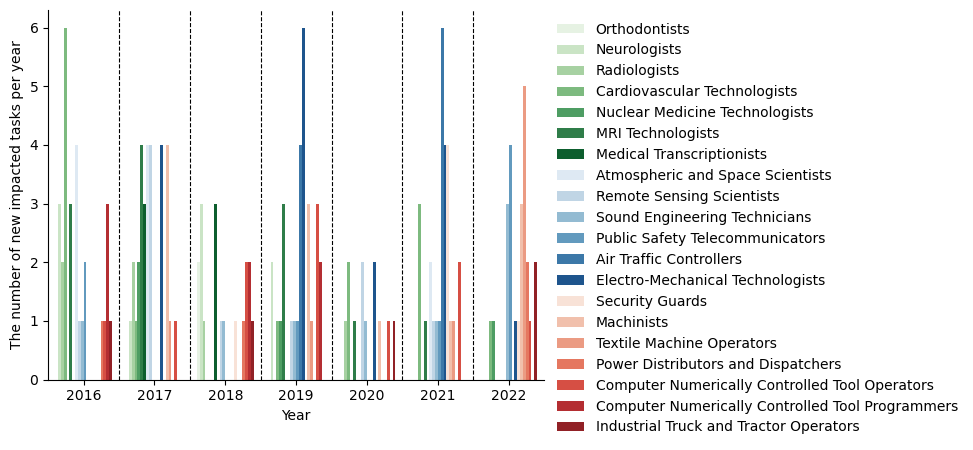

In [54]:
x = disrupted_tasks.pivot_table(
    index='year',
    columns='SOC Code',
    values='task',
    aggfunc='count',
    fill_value=0
)

q = x.diff().iloc[1:].reset_index().melt(id_vars='year').merge(
    job_sectors,
    how='left',
    on='SOC Code'
).sort_values(['sector', 'year'])

sns.barplot(
    x='year',
    y='value',
    hue='short_title',
    data=q.assign(short_title=q['Title'].map(short_title_map)),
    palette=sns.color_palette('Greens', 7) + sns.color_palette('Blues', 6) + sns.color_palette('Reds', 7),
)
for i in np.arange(0.5, 6.5):
    plt.axvline(i, color='k', linestyle='--', linewidth=.8)
plt.legend(bbox_to_anchor=(1, 1), frameon=False)
plt.xlabel('Year')
plt.ylabel('The number of new impacted tasks per year')
sns.despine()

/var/folders/0d/380dd3_d27v3p6p6m6nb230h0000gn/T/ipykernel_63185/1591755062.py:30: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


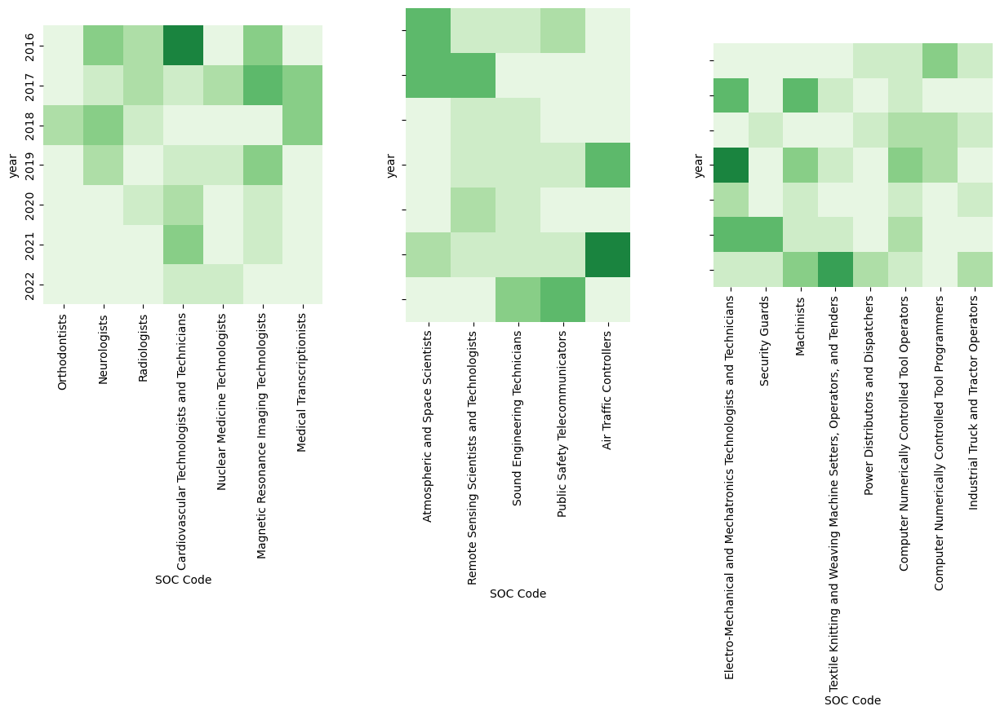

In [55]:
# Figure 2
import textwrap as tw

fig, axes = plt.subplots(ncols=3, sharey=True, figsize=(15, 5))
for ax, (s, group) in zip(axes.flatten(), q.groupby('sector')):
    cols = group['SOC Code'].unique().tolist()
    col_name_dict = group[['SOC Code', 'Title']].drop_duplicates().set_index('SOC Code')['Title'].to_dict()
    sns.heatmap(x[cols].rename(col_name_dict, axis=1).diff().iloc[1:], square=True, vmax=8, cmap=sns.color_palette('Greens', 8), cbar=False, ax=ax)
plt.tight_layout()
plt.savefig('figures/2022/heatmap.pdf', bbox_inches='tight')

In [56]:
dt = disrupted_tasks.drop_duplicates(subset=['SOC Code', 'task'])

In [154]:
from sklearn.feature_extraction.text import TfidfVectorizer, ENGLISH_STOP_WORDS

stop_words = list(ENGLISH_STOP_WORDS) + ['include', 'includes', 'including', 'method', 'methods', 'using', 'used', 'determine', 'based', 'provided']

v = TfidfVectorizer(ngram_range=(1, 3), max_features=50, stop_words=stop_words)
xx = v.fit_transform(dt.patent.values)
xx = (
    pd.DataFrame(xx.todense(), columns=v.get_feature_names_out())
    .assign(year=dt.year.values)
    .groupby('year')
    .sum()
)

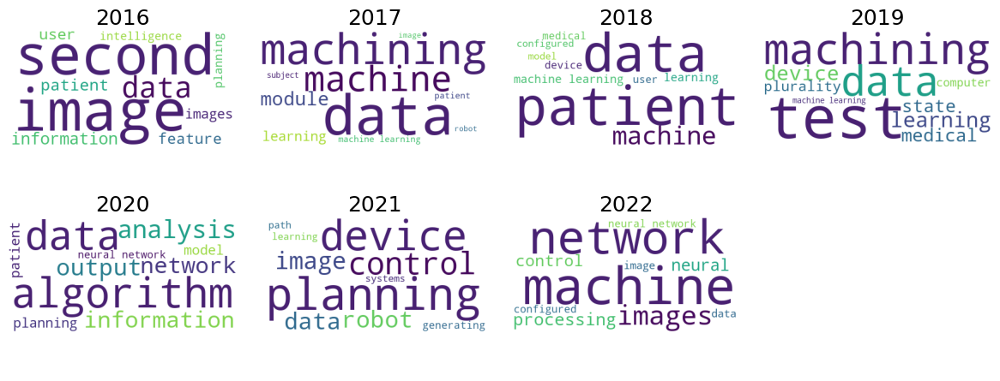

In [155]:
from wordcloud import WordCloud

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(12, 5))
for ax, year in zip(axes.flatten(), range(2016, 2023)):
    wc = WordCloud(background_color="white", random_state=42)
    wc.generate_from_frequencies(xx.T[year].sort_values().tail(10).to_dict())
    ax.imshow(wc)
    ax.set_title(year)
    ax.axis('off')
axes.flatten()[-1].axis('off')
plt.tight_layout()
plt.savefig('figures/2022/wordcloud.pdf', bbox_inches='tight')

In [59]:
# Table S5
print(
    pl.from_dataframe(tasks[tasks['SOC Code'].eq('47-4021')])
    .sort('s', descending=True)
    .select(
        'Task',
        pl.col('s').alias('Is impacted?')
    )
    .to_pandas()
    .style
    .to_latex()
)

\begin{tabular}{llr}
 & Task & Is impacted? \\
0 & Locate malfunctions in brakes, motors, switches, and signal and control systems, using test equipment. & True \\
1 & Assemble, install, repair, and maintain elevators, escalators, moving sidewalks, and dumbwaiters, using hand and power tools, and testing devices such as test lamps, ammeters, and voltmeters. & False \\
2 & Test newly installed equipment to ensure that it meets specifications, such as stopping at floors for set amounts of time. & False \\
3 & Check that safety regulations and building codes are met, and complete service reports verifying conformance to standards. & False \\
4 & Connect electrical wiring to control panels and electric motors. & False \\
5 & Adjust safety controls, counterweights, door mechanisms, and components such as valves, ratchets, seals, and brake linings. & False \\
6 & Read and interpret blueprints to determine the layout of system components, frameworks, and foundations, and to select installatio

# Sectors

In [60]:
df_aii = pd.DataFrame()
for year in range(2015, 2023):
    data_aii = compute_scores(
        task_embeddings,
        abstract_embeddings[patents.query('year <= @year').index],
        tasks,
        jobs,
    )
    data_aii['year'] = year
    df_aii = pd.concat([df_aii, data_aii], ignore_index=True)

In [61]:
from scipy.stats import beta

def compute_industry_scores(occupations, jobs_aii, year=None):
    data = (
        occupations
        .filter(pl.col('Item') == 'NAICS Sector')
        .filter(pl.col('Percent') != 'n/a')
        .join(pl.from_dataframe(jobs_aii), on='O*NET-SOC Code')
        # .sort(pl.col('Percent').cast(float)).group_by('Response').tail(68) # Only taking top 10%
        .filter(pl.col('Percent').cast(float) > 50)
        .with_columns(
            (pl.col('Percent').cast(float) * pl.col('aii')).alias('score')
        )
        .group_by('Response')
        .agg(
            pl.col('score').sum(),
            pl.col('Percent').cast(float).sum()
        )
        .filter(pl.col('Response') != 'Unclassified')
        .sort('score')
        .to_pandas()
    )

    # Using conservative views and a weakly informative prior
    data['aii'] = beta(
        1 + data['score'],
        9 + data['Percent'] - data['score']
    ).ppf(.25)
    # data['aii'] = data['score'] / data['Percent']
    data['aii_std'] = beta(
        1 + data['score'],
        9 + data['Percent'] - data['score']
    ).std()

    if year:
        data['year'] = year

    return data

In [62]:
sector_name = {
    'Accommodation and food services': 'Accommodation and food services',
    'Administrative and support and waste management and remediation services': 'Waste management',
    'Agriculture, forestry, fishing and hunting': 'Agriculture',
    'Arts, entertainment, and recreation': 'Arts and entertainment',
    'Construction': 'Construction',
    'Education services': 'Education',
    'Finance and insurance': 'Finance and insurance',
    'Health care and social assistance': 'Healthcare',
    'Information': 'Information technology',
    'Manufacturing': 'Manufacturing',
    'Mining': 'Mining',
    'Other services, except public administration': 'Other services',
    'Professional, Scientific and Technical Services': 'Scientific and technical services',
    'Public administration': 'Public administration',
    'Real estate and rental and leasing': 'Real estate',
    'Retail trade': 'Retail trade',
    'Transportation and warehousing': 'Transportation',
    'Utilities': 'Utilities',
    'Wholesale trade': 'Wholesale trade',
}

In [63]:
(
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .with_columns(pl.col('O*NET-SOC Code').str.slice(0, 7).alias('SOC Code'))
    .join(pl.from_dataframe(data), on='SOC Code')
    .filter(pl.col('Percent').cast(float) == pl.col('Percent').cast(float).max().over('SOC Code'))
    .sort(['aii', 'total_tasks'], descending=True)
    .filter(pl.col('Occupation Title').str.contains('Solar'))
    .to_pandas()
)

,O*NET-SOC Code,Item,Response,N,Percent,Date,SOC Code,nb_impacted_tasks,total_tasks,Title,aii,Occupation Title,aioe,mu_aii,sigma_aii,occ_group
0,47-2231.00,NAICS Sector,Construction,66,74.2,07/2012,47-2231,1,26,Solar Photovoltaic Installers,0.038462,Solar Photovoltaic Installers,-0.944169,0.071429,0.047824,47


In [64]:
sectors = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .join(pl.from_dataframe(jobs_aii), on='O*NET-SOC Code')
    # .sort(pl.col('Percent').cast(float)).group_by('Response').tail(68) # Only taking top 10%
    .filter(pl.col('Percent').cast(float) > 50)
    .with_columns(
        pl.col('aii').ne(0).alias('is_impacted')
    )
    .group_by('Response')
    .agg(
        pl.col('is_impacted').sum().truediv(pl.col('is_impacted').count()).alias('fraction'),
        pl.col('is_impacted').count().alias('total_jobs'),
    )
    .filter(pl.col('Response') != 'Unclassified')
    .sort('fraction')
    .to_pandas()
)

In [65]:
# sectors.set_index('Response').rename({'Administrative and support and waste management and remediation services': "Waste management"}).fraction.plot.barh()
# plt.xlabel('Fraction of impacted occupations')
# sns.despine()
# plt.savefig('figures/sectors-fraction.pdf', bbox_inches='tight')

In [66]:
soc_sector_map = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .filter(pl.col('Percent').cast(float) > 50)
    .with_columns(pl.col('O*NET-SOC Code').str.slice(0, 7).alias('SOC Code'))
    .group_by('SOC Code', 'Response')
    .count()
    .filter(pl.col('count').eq(pl.col('count').max().over('SOC Code')))
    .select('SOC Code', pl.col('Response').alias('Sector'))
)

In [70]:
sns.set_context('talk')

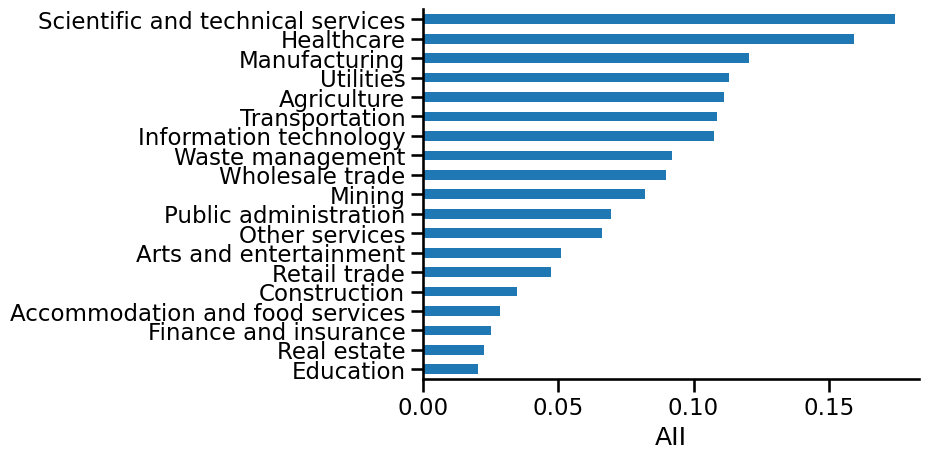

In [199]:
# Fig 3a
industry_scores = compute_industry_scores(occupations, jobs_aii)
industry_scores.set_index('Response').rename(sector_name).aii.sort_values().plot.barh()
plt.xlabel('AII')
plt.ylabel('')
sns.despine()
plt.savefig('figures/2022/sectors.pdf', bbox_inches='tight')

In [200]:
industry_scores[['Response', 'aii', 'aii_std']].to_csv('datasets/2022/aii_sector.csv', index=False)

In [72]:
occ_agg = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    # .filter(pl.col('Percent') != "0.0")
    .filter(pl.col('Percent').cast(float) > 50)
    .join(pl.from_dataframe(jobs_aii), on='O*NET-SOC Code')
    # .sort(pl.col('Percent').cast(float), pl.col('N').cast(int)).group_by('Response').tail(68) # Only taking top 10%
    .join(pl.from_dataframe(tasks), on='O*NET-SOC Code')
    .to_pandas()
    .groupby('Response')
    .agg({
        'Task ID': pd.Series.nunique,
        'SOC Code': pd.Series.nunique
    })
    .reset_index()
)

In [73]:
patent_map = patents[patents['year'].ge(2015) & patents['year'].le(2022)].title.reset_index(drop=True).to_dict()
top_tasks = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    # .filter(pl.col('Percent') != "0.0")
    .filter(pl.col('Percent').cast(float) > 50)
    .join(pl.from_dataframe(jobs_aii), on='O*NET-SOC Code')
    .join(pl.from_dataframe(tasks), on='O*NET-SOC Code')
    .sort(pl.col('similarity')).group_by('Response').tail(1)
    .select(
        pl.col('Response').alias('sector'),
        pl.col('Title'),
        pl.col('Task'),
        pl.col('patent_index'),
        pl.col('similarity')
    )
    .to_pandas()
)

top_tasks['patent'] = top_tasks['patent_index'].map(patent_map)

selected_occupations = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .filter(pl.col('Percent').cast(float) > 50)
    .select('O*NET-SOC Code')
    .to_numpy()
    .flatten()
    .tolist()
)

top_patents = (
    pl.from_dataframe(tasks)
    .filter(pl.col('patent_index').is_in(top_tasks['patent_index'].tolist()))
    .filter(pl.col('O*NET-SOC Code').is_in(selected_occupations))
    .group_by('patent_index')
    .agg(
        pl.col('Task ID').n_unique().alias('nb_tasks'),
        pl.col('SOC Code').n_unique().alias('nb_jobs'),
    )
    .to_pandas()
)

top_tasks = top_tasks.merge(
    top_patents,
    how='left',
    on='patent_index',
)

sector_summary = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .filter(pl.col('Percent').cast(float) > 50)
    .join(pl.from_dataframe(jobs_aii), on='O*NET-SOC Code')
    .join(pl.from_dataframe(tasks), on='O*NET-SOC Code')
    .group_by('Response')
    .agg(
        pl.col('Task ID').n_unique().alias('total_tasks'),
        pl.col('SOC Code').n_unique().alias('total_jobs'),
    )
    .select(
        pl.col('Response').alias('sector'),
        'total_tasks',
        'total_jobs',
    )
    .to_pandas()
)

In [74]:
df_sectors = pd.DataFrame()
for year, group in df_aii.groupby('year'):
    df_sectors = pd.concat([
        df_sectors,
        compute_industry_scores(occupations, group, year)
    ], ignore_index=True)
df_sectors = df_sectors.rename({'Response': 'sector'}, axis=1)

In [75]:
sector_trends = []
for sector, group in df_sectors.groupby('sector'):
    reg = LinearRegression()
    support = np.arange(len(group)).reshape(-1, 1)
    y = group['aii']
    reg.fit(support, y)
    y_pred = reg.predict(support)
    r2 = r2_score(y, y_pred)
    sector_trends.append({
        'sector': sector,
        'slope': reg.coef_[0],
        'difference': group['aii'].max() - group['aii'].min(),
        'aii': group['aii'].max(),
        'r2': r2,
    })
sector_trends = pd.DataFrame(sector_trends)

In [76]:
# def categorise_sector_trends(sector):
#     if sector['r2'] < 0.96:
#         return 0
#     elif sector['slope'] > 0.014:
#         return 1
#     else:
#         return 2
# 
# sector_trends['group'] = sector_trends.apply(categorise_sector_trends, axis=1)

sector_trends['group'] = pd.qcut(sector_trends['difference'], 3).cat.codes

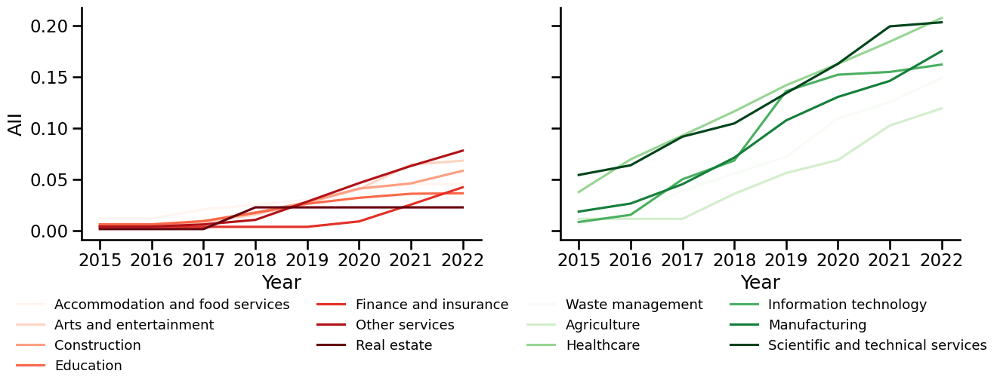

In [77]:
# Figure 3c
fig, axes = plt.subplots(ncols=2, figsize=(15, 4), sharey=True)
for ax, (g, group), c in zip(axes, sector_trends.query('group in [0, 2]').groupby('group'), ['Reds', 'Greens']):
    df_sectors.query('sector in @group.sector').pivot_table(
        index='year',
        columns='sector',
        values='aii'
    ).rename(sector_name, axis=1).plot.line(cmap=c, ax=ax)
    # ax.set_ylim(0.35, 0.65)
    ax.set_xticks(np.arange(2015, 2023))
    ax.set_xlabel('Year')
    ax.set_ylabel('AII')
    ax.legend(bbox_to_anchor=(1.1, -0.2), ncols=2, frameon=False, fontsize=13)
    # plt.tight_layout()
    sns.despine()
plt.savefig('figures/2022/trends-sectors.pdf', bbox_inches='tight')

In [78]:
sector_job = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .join(pl.from_dataframe(jobs_aii), on='O*NET-SOC Code')
    # .sort(pl.col('Percent').cast(float)).group_by('Response').tail(68) # Only taking top 10%
    .filter(pl.col('Percent').cast(float) > 50)
    .with_columns(
        (pl.col('Percent').cast(float) * pl.col('aii')).alias('score')
    )
    .select(
        pl.col('Response').alias('sector'),
        'SOC Code',
        'Title',
        'Description'
    )
)

In [79]:
for i, rate in enumerate(['low', 'mid', 'high']):
    (
        pl.from_dataframe(sector_trends)
        .filter(pl.col('group').eq(i))
        .join(sector_job, how='left', on='sector')
        .select('sector', 'SOC Code', 'Title', 'Description')
        .join(pl.from_dataframe(tasks), how='left', on='SOC Code')
        .select('sector', 'SOC Code', 'Title', 'Description', 'Task', 'similarity_t', 'patent_index')
        .with_columns(pl.col('patent_index').map_dict(patent_map).alias('patent'))
        .to_pandas()
        .to_csv(f'datasets/2022_trend_{rate}.csv', index=False)
    )

# States

In [84]:
df_county = pd.read_csv('datasets/county_naics_2022.csv', dtype={'industry_code': str, 'area_fips': str})
df_county['sector_code'] = df_county['industry_code'].str[:2]
df_county['fips'] = df_county['area_fips'].str[:2]
df_county.head()

,area_fips,own_code,industry_code,agglvl_code,size_code,year,qtr,disclosure_code,annual_avg_estabs,annual_avg_emplvl,...,oty_taxable_annual_wages_chg,oty_taxable_annual_wages_pct_chg,oty_annual_contributions_chg,oty_annual_contributions_pct_chg,oty_annual_avg_wkly_wage_chg,oty_annual_avg_wkly_wage_pct_chg,oty_avg_annual_pay_chg,oty_avg_annual_pay_pct_chg,sector_code,fips
0,01000,0,10,50,0,2022,A,NaN,148979,2026102,...,841800853,5.1,-48478330,-18.1,57,5.5,2951,5.4,10,01
1,01000,1,10,51,0,2022,A,NaN,1257,55220,...,0,0.0,0,0.0,52,3.0,2691,3.0,10,01
2,01000,1,102,52,0,2022,A,NaN,1257,55220,...,0,0.0,0,0.0,52,3.0,2691,3.0,10,01
3,01000,1,1021,53,0,2022,A,NaN,619,11505,...,0,0.0,0,0.0,42,3.1,2172,3.1,10,01
4,01000,1,1022,53,0,2022,A,NaN,2,11,...,0,0.0,0,0.0,19,3.0,978,3.0,10,01


In [85]:
import requests

geojson = requests.get('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json').json()

In [86]:
naics_mapping = {
    11: 'Agriculture, forestry, fishing and hunting',
    21: 'Mining',
    22: 'Utilities',
    23: 'Construction',
    31: 'Manufacturing',
    32: 'Manufacturing',
    33: 'Manufacturing',
    42: 'Wholesale trade',
    44: 'Retail trade',
    45: 'Retail trade',
    48: 'Transportation and warehousing',
    49: 'Transporation and warehousing',
    51: 'Information',
    52: 'Finance and insurance',
    53: 'Real estate and rental and leasing',
    54: 'Professional, Scientific, and Technical Services',
    55: 'Management of Companies and Enterprises',
    56: 'Administrative and support and waste management and remediation services',
    61: 'Education services',
    62: 'Health care and social assistance',
    71: 'Arts, entertainment, and recreation',
    72: 'Accommodation and food services',
    81: 'Other services, except public administration',
    92: 'Public administration',
}

In [87]:
county_data = df_county[~df_county['fips'].isin(['72', '78', 'C1', 'C2', 'C3', 'C4', 'US'])].copy()

In [88]:
county_data['sector'] = county_data['sector_code'].astype('int').map(naics_mapping)

In [89]:
state_data = (
    pl.from_dataframe(county_data)
    .filter(pl.col('area_fips').str.ends_with('000'))
    .to_pandas()
)
state_agg = state_data.groupby(['fips', 'sector']).annual_avg_emplvl.sum().reset_index()

county_agg = (
    pl.from_dataframe(county_data)
    .filter(~pl.col('area_fips').str.ends_with('000'))
    .select('area_fips', 'fips', 'sector', 'annual_avg_emplvl')
    .drop_nulls()
    .group_by(['area_fips', 'fips', 'sector'])
    .agg(pl.col('annual_avg_emplvl').sum())
    .to_pandas()
)
# county_agg = state_data[['area_fips', 'fips', 'sector', 'annual_avg_emplvl']].dropna().groupby(['area_fips', 'fips', 'sector']).sum().reset_index()

In [90]:
state_fips = pd.read_csv('https://raw.githubusercontent.com/kjhealy/fips-codes/master/state_fips_master.csv')
state_fips['fips'] = state_fips['fips'].apply(lambda x: '{:02d}'.format(x))

In [91]:
from sklearn.preprocessing import StandardScaler

def compute_state_scores(county_agg, state_fips, sector_trends, grouping='area_fips'):
    aige = pd.merge(
        county_agg,
        sector_trends,
        how='left',
        on='sector'
    ).dropna()

    aige_map = (
        pl.from_dataframe(aige)
        .with_columns(
            pl.col('annual_avg_emplvl').truediv(pl.col('annual_avg_emplvl').sum().over(grouping)).alias('weight')
        )
        .with_columns(
            pl.col('aii').mul(pl.col('weight')).alias('aii_normalized')
        )
        .group_by(grouping)
        .agg(pl.col('aii_normalized').sum())
        .to_pandas()
    )

    aige_map['aii_scaled'] = StandardScaler().fit_transform(aige_map[['aii_normalized']])

    if grouping == 'area_fips':
        return aige_map
    else:
        aigi = pd.merge(
            aige_map,
            state_fips,
            how='left',
            on='fips'
        )

        return aigi

In [92]:
area_titles = pd.read_csv('datasets/area-titles.tsv', sep='\t', names=['area_fips', 'title'])

In [93]:
aigi = compute_state_scores(
    county_agg,
    # state_agg,
    state_fips,
    sector_trends
)
aigi = pd.merge(aigi, area_titles, how='left', on='area_fips')

In [209]:
aigi.to_csv('datasets/2022/aii_county.csv', index=False)

In [206]:
state_aii = compute_state_scores(
    county_agg,
    state_fips,
    sector_trends,
    grouping='fips'
).sort_values('state_name')
state_aii

,fips,aii_normalized,aii_scaled,state_name,state_abbr,long_name,sumlev,region,division,state,region_name,division_name
2,01,0.109346,0.424959,Alabama,AL,Alabama AL,40.0,3.0,6.0,1.0,South,East South Central
42,02,0.102322,-0.895058,Alaska,AK,Alaska AK,40.0,4.0,9.0,2.0,West,Pacific
20,04,0.107551,0.087579,Arizona,AZ,Arizona AZ,40.0,4.0,8.0,4.0,West,Mountain
13,05,0.110285,0.601288,Arkansas,AR,Arkansas AR,40.0,3.0,7.0,5.0,South,West South Central
1,06,0.112507,1.019029,California,CA,California CA,40.0,4.0,9.0,6.0,West,Pacific
35,08,0.102413,-0.877979,Colorado,CO,Colorado CO,40.0,4.0,8.0,8.0,West,Mountain
8,09,0.112078,0.938237,Connecticut,CT,Connecticut CT,40.0,1.0,1.0,9.0,Northeast,New England
47,10,0.101891,-0.976019,Delaware,DE,Delaware DE,40.0,3.0,5.0,10.0,South,South Atlantic
49,12,0.104020,-0.575899,Florida,FL,Florida FL,40.0,3.0,5.0,12.0,South,South Atlantic
46,13,0.105783,-0.244728,Georgia,GA,Georgia GA,40.0,3.0,5.0,13.0,South,South Atlantic


In [207]:
state_aii.to_csv('datasets/2022/aii_state.csv', index=False)

In [95]:
us = pd.read_csv('datasets/us_states_geo.csv')
mega = pd.read_csv('datasets/US_State_Control_Data_Master.csv')
ise = pd.read_csv('datasets/ISE_states.csv')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


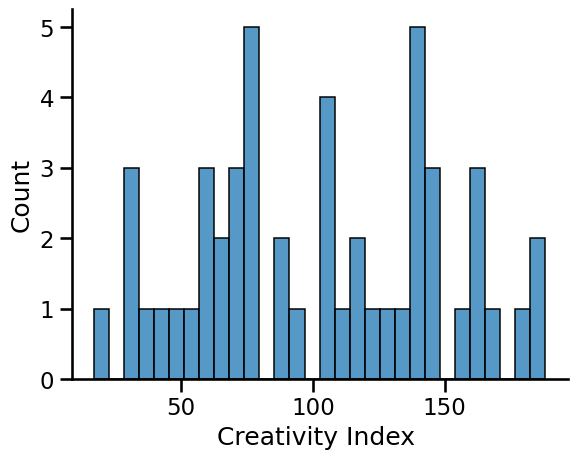

In [96]:
sns.histplot(x=ise['Creativity Index '], bins=30)
sns.despine()

In [97]:
state_joined = compute_state_scores(
    county_agg,
    state_fips,
    sector_trends,
    grouping='fips'
).merge(
    us[['state_code', 'gdp per capita (2017)', 'gini-coefficient']],
    how='left',
    left_on='state_abbr',
    right_on='state_code'
).merge(
    # mega[['State Abbreviation', 'E_1a_occupationArtistic']].rename({'State Abbreviation': 'state_abbr'}, axis=1),
    ise[['State Abbreviation', 'Creativity Index ']].rename({'State Abbreviation': 'state_abbr', 'Creativity Index ': 'creativity'}, axis=1),
    how='left',
    on='state_abbr'
)

In [98]:
state_joined[['aii_scaled', 'gdp per capita (2017)']].corr()

,aii_scaled,gdp per capita (2017)
aii_scaled,1.000000,-0.033451
gdp per capita (2017),-0.033451,1.000000


In [99]:
state_joined[['aii_scaled', 'gini-coefficient']].corr()

,aii_scaled,gini-coefficient
aii_scaled,1.000000,0.349163
gini-coefficient,0.349163,1.000000


In [100]:
state_joined.sort_values([
    'gini-coefficient',
    'aii_scaled',
]).tail(10)

,fips,aii_normalized,aii_scaled,state_name,state_abbr,long_name,sumlev,region,division,state,region_name,division_name,state_code,gdp per capita (2017),gini-coefficient,creativity
19,34,0.108872,0.335930,New Jersey,NJ,New Jersey NJ,40.0,1.0,2.0,34.0,Northeast,Middle Atlantic,NJ,56472.0,0.4813,158.0
29,21,0.114520,1.397275,Kentucky,KY,Kentucky KY,40.0,3.0,6.0,21.0,South,East South Central,KY,38603.0,0.4813,40.0
9,28,0.106328,-0.142283,Mississippi,MS,Mississippi MS,40.0,3.0,6.0,28.0,South,East South Central,MS,31633.0,0.4828,30.0
18,01,0.109346,0.424959,Alabama,AL,Alabama AL,40.0,3.0,6.0,1.0,South,East South Central,AL,36856.0,0.4847,75.0
7,12,0.104020,-0.575899,Florida,FL,Florida FL,40.0,3.0,5.0,12.0,South,South Atlantic,FL,39093.0,0.4852,131.0
40,06,0.112507,1.019029,California,CA,California CA,40.0,4.0,9.0,6.0,West,Pacific,CA,57328.0,0.4899,184.0
28,09,0.112078,0.938237,Connecticut,CT,Connecticut CT,40.0,1.0,1.0,9.0,Northeast,New England,CT,63747.0,0.4945,167.0
38,22,0.110772,0.692976,Louisiana,LA,Louisiana LA,40.0,3.0,7.0,22.0,South,West South Central,LA,44293.0,0.4990,67.0
8,36,0.110838,0.705338,New York,NY,New York NY,40.0,1.0,2.0,36.0,Northeast,Middle Atlantic,NY,64093.0,0.5229,178.0
34,11,0.101534,-1.043048,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [101]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

temp = state_joined[['state_name', 'aii_scaled', 'gdp per capita (2017)', 'gini-coefficient', 'creativity']].dropna()
mdl = LinearRegression()
mdl.fit(temp[['aii_scaled']], temp['gdp per capita (2017)'])
r2_score(temp['gdp per capita (2017)'], mdl.predict(temp[['aii_scaled']]))

0.0011189758304753772

In [102]:
temp[np.abs((temp['gini-coefficient'] - temp['gini-coefficient'].mean()) / temp['gini-coefficient'].std()).ge(2)]

,state_name,aii_scaled,gdp per capita (2017),gini-coefficient,creativity
8,New York,0.705338,64093.0,0.5229,178.0
10,Utah,-0.705218,44204.0,0.4063,104.0
33,Alaska,-0.895058,67705.0,0.4081,72.0


In [103]:
mdl = LinearRegression()
mdl.fit(temp[['aii_scaled']], temp['gini-coefficient'])
y_true = temp['gini-coefficient'].values
y_pred = mdl.predict(temp[['aii_scaled']])

residuals = y_true - y_pred
z_residuals = (residuals - residuals.mean()) / residuals.std()
temp[np.abs(z_residuals) > 2]
# r2_score(temp['gini-coefficient'], mdl.predict(temp[['aii_scaled']]))


,state_name,aii_scaled,gdp per capita (2017),gini-coefficient,creativity
8,New York,0.705338,64093.0,0.5229,178.0
10,Utah,-0.705218,44204.0,0.4063,104.0
17,New Hampshire,0.763141,50456.0,0.4304,137.0
33,Alaska,-0.895058,67705.0,0.4081,72.0


/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


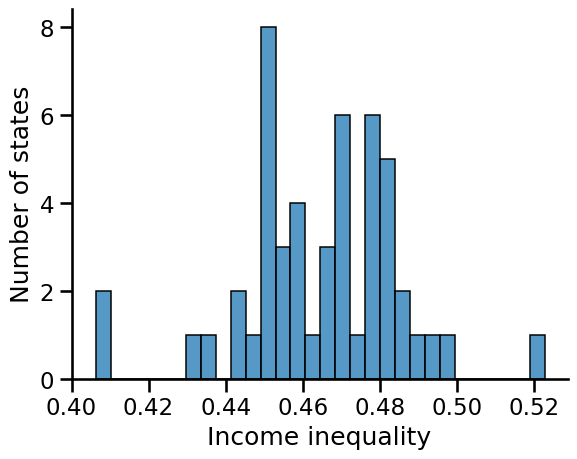

In [104]:
sns.histplot(x=state_joined['gini-coefficient'], bins=30)
plt.xlim(0.4)
plt.xlabel('Income inequality')
plt.ylabel('Number of states')
sns.despine()
plt.savefig('figures/2022/hist-inequality.pdf', bbox_inches='tight')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


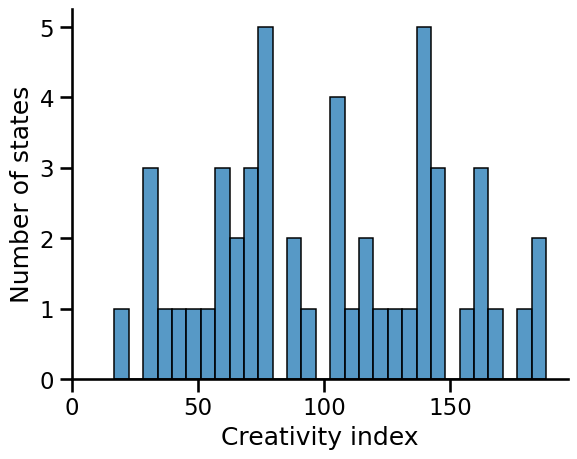

In [105]:
sns.histplot(x=state_joined['creativity'], bins=30)
plt.xlim(0)
plt.xlabel('Creativity index')
plt.ylabel('Number of states')
sns.despine()
plt.savefig('figures/2022/hist-creativity.pdf', bbox_inches='tight')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


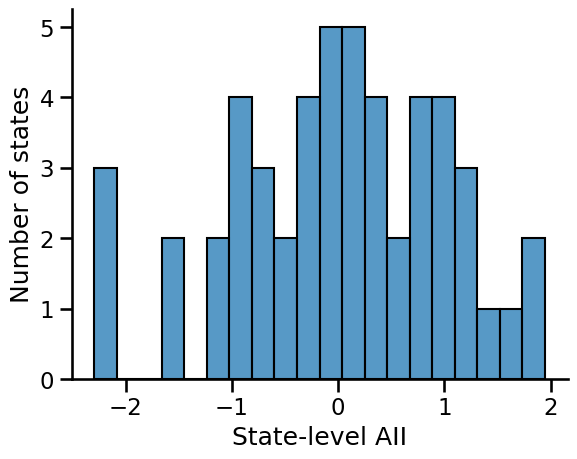

In [106]:
sns.histplot(x=state_joined['aii_scaled'], bins=20)
plt.xlabel('State-level AII')
plt.ylabel('Number of states')
sns.despine()
plt.savefig('figures/2022/hist-aii.pdf', bbox_inches='tight')

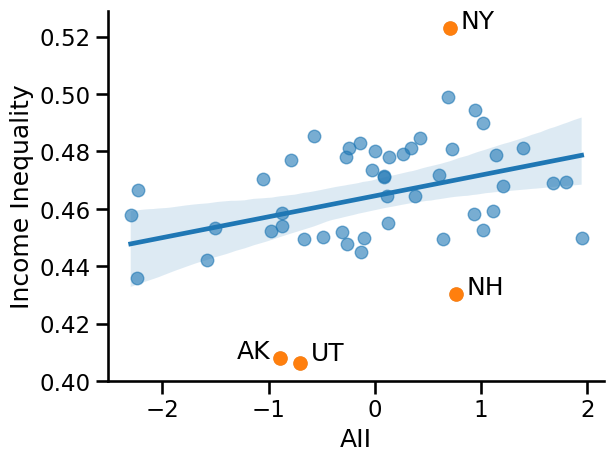

In [180]:
sns.regplot(
    state_joined,
    x='aii_scaled',
    y='gini-coefficient',
    scatter_kws=dict(
        alpha=.6,
    ),
)
outliers = state_joined[state_joined['state_abbr'].isin(['AK', 'UT', 'NH', 'NY'])]
plt.scatter(outliers['aii_scaled'], outliers['gini-coefficient'], c='C1')
for idx, row in outliers.iterrows():
    if row['state_abbr'] == 'AK':
        xy = (row['aii_scaled'] - .4, row['gini-coefficient'])
    elif row['state_abbr'] == 'UT':
        xy = (row['aii_scaled'] + .1, row['gini-coefficient'] + .001)
    else:
        xy = (row['aii_scaled'] + .1, row['gini-coefficient'])
    plt.annotate(row['state_abbr'], xy)
plt.ylim(0.4)
plt.xlabel('AII')
plt.ylabel('Income Inequality')
sns.despine()
plt.savefig('figures/2022/aigi-gini.pdf', bbox_inches='tight')

In [108]:
state_joined[['aii_scaled', 'creativity']].corr()

,aii_scaled,creativity
aii_scaled,1.000000,0.290155
creativity,0.290155,1.000000


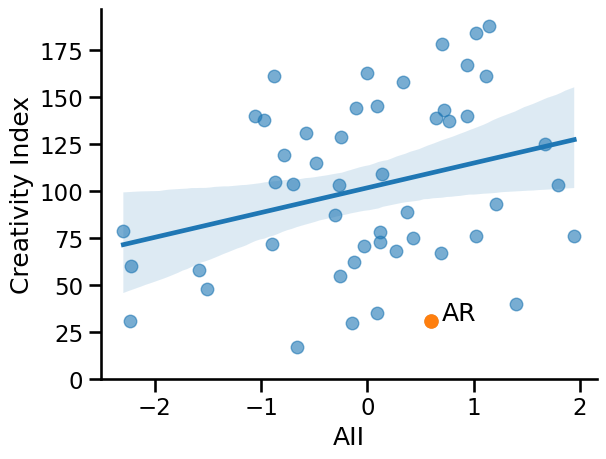

In [109]:
sns.regplot(
    state_joined,
    x='aii_scaled',
    y='creativity',
    scatter_kws=dict(
        alpha=.6,
    ),
)
outliers = state_joined[state_joined['state_abbr'].isin(['AR'])]
plt.scatter(outliers['aii_scaled'], outliers['creativity'], c='C1')
for idx, row in outliers.iterrows():
    xy = (row['aii_scaled'] + .1, row['creativity'])
    plt.annotate(row['state_abbr'], xy)
plt.ylim(0)
plt.xlabel('AII')
plt.ylabel('Creativity Index')
sns.despine()
plt.savefig('figures/2022/aigi-creative.pdf', bbox_inches='tight')

In [110]:
aigi['fips'] = aigi['area_fips'].str[:2]

In [111]:
pd.merge(
    aigi.groupby('fips').agg({'aii_normalized': 'mean'}).reset_index(),
    state_fips,
    how='left',
    on='fips',
).nlargest(3, 'aii_normalized')

,fips,aii_normalized,state_name,state_abbr,long_name,sumlev,region,division,state,region_name,division_name
8,11,0.125293,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
38,42,0.114579,Pennsylvania,PA,Pennsylvania PA,40.0,1.0,2.0,42.0,Northeast,Middle Atlantic
17,21,0.111704,Kentucky,KY,Kentucky KY,40.0,3.0,6.0,21.0,South,East South Central


In [112]:
pd.merge(
    aigi.groupby('fips').agg({'aii_normalized': 'mean'}).reset_index(),
    state_fips,
    how='left',
    on='fips',
).nsmallest(3, 'aii_normalized')

,fips,aii_normalized,state_name,state_abbr,long_name,sumlev,region,division,state,region_name,division_name
26,30,0.087052,Montana,MT,Montana MT,40.0,4.0,8.0,30.0,West,Mountain
44,49,0.087546,Utah,UT,Utah UT,40.0,4.0,8.0,49.0,West,Mountain
34,38,0.091687,North Dakota,ND,North Dakota ND,40.0,2.0,4.0,38.0,Midwest,West North Central


In [113]:
print(
    pd.DataFrame({
        'Highest scoring': aigi.nlargest(20, 'aii_scaled').title.values,
        'Lowest scoring': aigi.nsmallest(20, 'aii_scaled').title.values,
    })
    .style.to_latex()
)

\begin{tabular}{lll}
 & Highest scoring & Lowest scoring \\
0 & Buffalo County, South Dakota & Moore County, Tennessee \\
1 & Robertson County, Kentucky & Arthur County, Nebraska \\
2 & Aleutians East Borough, Alaska & Calhoun County, Illinois \\
3 & Delta County, Texas & Denali Borough, Alaska \\
4 & Cumberland County, Kentucky & Glascock County, Georgia \\
5 & Metcalfe County, Kentucky & McPherson County, Nebraska \\
6 & Cameron County, Pennsylvania & Piute County, Utah \\
7 & Hardin County, Illinois & Banner County, Nebraska \\
8 & Unknown Or Undef., District of Columbia & Loup County, Nebraska \\
9 & Miller County, Georgia & Long County, Georgia \\
10 & Starr County, Texas & Oldham County, Texas \\
11 & Evangeline Parish, Louisiana & Elk County, Kansas \\
12 & Saluda County, South Carolina & Love County, Oklahoma \\
13 & Duval County, Texas & Gilpin County, Colorado \\
14 & Hancock County, Kentucky & Williamsburg City, Virginia \\
15 & Franklin County, Texas & Tunica County, Missis

In [114]:
aigi['is_positive'] = aigi['aii_scaled'].ge(0)

In [115]:
import plotly.express as px

fig = px.choropleth(
    # df_county[~df_county['fips'].isin(['72', '78', 'C1', 'C2', 'C3', 'C4', 'US']) & df_county['industry_code'].eq('5191')],
    aigi,
    geojson=geojson, locations='area_fips', color='aii_scaled', scope='usa',
    # color_continuous_scale='PuOr_r',
    # color_continuous_scale=['#5e3c99', '#b2abd2', '#ffffff', '#fdb863', '#e66101'],
    color_continuous_scale=['#4169E1', '#ffffff', '#DC143C'],
    range_color=(-2.5, 2.5),
    width=800
)
# fig = px.choropleth(
#     locations=aigi['state_abbr'],
#     locationmode='USA-states',
#     color=aigi['aii_scaled'],
#     scope='usa',
#     color_continuous_scale='RdBu_r',
#     range_color=(-2.5, 2.5),
#     width=800
# )

fig.update_layout(
    coloraxis_colorbar_x=0.95,
    coloraxis_colorbar=dict(
        title="AII",
    ),
    margin=dict(
        l=0, r=0, t=0, b=0
    ),
)
fig.update_traces(marker_line_width=0.3)
fig.show()
fig.write_image('figures/2022/aigi-counties.pdf')

In [116]:
selected_regions = [
    '53033', # Seattle
    '06085', # Silicon Valley
    '36061', # Manhattan, New York
    '02185', # Alaska
]

In [117]:
(
    pl.from_dataframe(county_agg)
    .filter(pl.col('area_fips').is_in(selected_regions))
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emp')
    )
    .with_columns(
        pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('impacted_workforce')
    )
    .sort('annual_avg_emplvl')
    # .group_by('area_fips').tail(1)
    .join(pl.from_dataframe(aigi), on='area_fips')
    .pivot(
        index='sector',
        columns='title',
        values='impacted_workforce'
    )
    # .select(
    #     pl.col('title').alias('County'),
    #     pl.col('sector').alias('Most Impacted Sector'),
    #     pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('Impacted Workforce'),
    # )
    .to_pandas()
    .set_index('sector')
    .fillna(0)
    .style.format('{:.0%}')
)

,"Santa Clara County, California","King County, Washington","North Slope Borough, Alaska","New York County, New York"
sector,,,,
Mining,0%,0%,54%,0%
"Agriculture, forestry, fishing and hunting",0%,0%,0%,0%
Utilities,0%,0%,0%,0%
Transporation and warehousing,1%,1%,0%,1%
Transportation and warehousing,1%,4%,1%,0%
Management of Companies and Enterprises,1%,5%,3%,3%
Real estate and rental and leasing,1%,2%,1%,4%
"Arts, entertainment, and recreation",2%,2%,1%,2%
Finance and insurance,2%,3%,0%,13%


In [118]:
df_states = pd.DataFrame()
for year in range(2015, 2021):
    df_states = pd.concat([
        df_states,
        compute_state_scores(
            county_agg, state_fips, df_sectors[df_sectors['year'].le(year)]
        ).assign(year=year)
    ], ignore_index=True)
df_states = pd.merge(df_states, area_titles, how='left', on='area_fips')

In [119]:
state_entropy = (
    pl.from_dataframe(state_agg)
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('fips').alias('total_emplvl')
    )
    .with_columns(
        pl.col('annual_avg_emplvl').truediv(pl.col('total_emplvl')).alias('pk')
    )
    .with_columns(
        pl.col('pk').mul(pl.col('pk').map_elements(np.log2)).fill_nan(0)
    )
    .group_by('fips')
    .agg(-pl.col('pk').sum())
    .to_pandas()
)

In [120]:
county_entropy = (
    pl.from_dataframe(county_agg)
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emplvl')
    )
    .with_columns(
        pl.col('annual_avg_emplvl').truediv(pl.col('total_emplvl')).alias('pk')
    )
    .with_columns(
        pl.col('pk').mul(pl.col('pk').map_elements(np.log2)).fill_nan(0)
    )
    .group_by('area_fips')
    .agg(-pl.col('pk').sum())
    .to_pandas()
)

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/polars/series/series.py:5028: RuntimeWarning:

divide by zero encountered in log2

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/polars/series/series.py:5028: RuntimeWarning:

divide by zero encountered in log2



/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



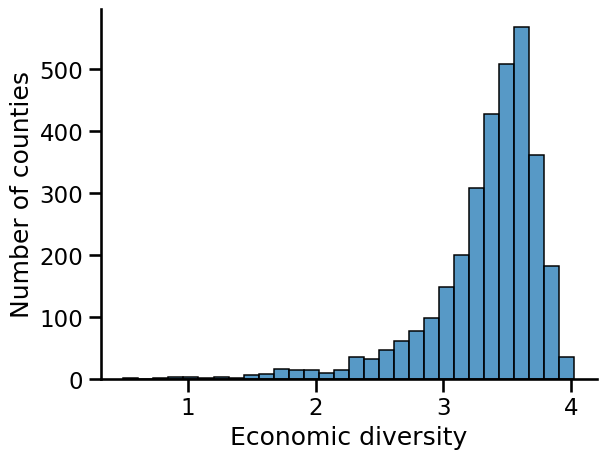

In [121]:
sns.histplot(county_entropy['pk'], bins=30)
plt.xlabel('Economic diversity')
plt.ylabel('Number of counties')
sns.despine()
plt.savefig('figures/2022/hist-entropy.pdf', bbox_inches='tight')

In [122]:
top_regions = aigi.nlargest(20, 'aii_scaled').area_fips.tolist()
bottom_regions = aigi.nsmallest(20, 'aii_scaled').area_fips.tolist()

In [123]:
(
    pl.from_dataframe(county_agg)
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emp')
    )
    .sort('annual_avg_emplvl')
    .group_by('area_fips').tail(1)
    .join(pl.from_dataframe(aigi), on='area_fips')
    .join(pl.from_dataframe(county_entropy), on='area_fips')
    .sort('pk', descending=True)
    .head(20)
    .select(
        pl.col('area_fips'),
        pl.col('title').alias('County'),
        # pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('Impacted Workforce'),
        pl.col('pk').alias('Economic Diversity'),
        pl.col('sector').alias('Most Prevalent Sector'),
    )
    .to_pandas()
)

,area_fips,County,Economic Diversity,Most Prevalent Sector
0,08031,"Denver County, Colorado",4.024225,"Professional, Scientific, and Technical Services"
1,41051,"Multnomah County, Oregon",3.992880,Health care and social assistance
2,13121,"Fulton County, Georgia",3.984826,"Professional, Scientific, and Technical Services"
3,49035,"Salt Lake County, Utah",3.984107,Health care and social assistance
4,08123,"Weld County, Colorado",3.981017,Construction
5,48201,"Harris County, Texas",3.980071,Health care and social assistance
6,48113,"Dallas County, Texas",3.979897,"Professional, Scientific, and Technical Services"
7,53033,"King County, Washington",3.976027,Health care and social assistance
8,27037,"Dakota County, Minnesota",3.970370,Retail trade
9,55025,"Dane County, Wisconsin",3.959750,Health care and social assistance


In [124]:
# Table 3 - top
print(
    pl.from_dataframe(county_agg)
    .filter(pl.col('area_fips').is_in(top_regions))
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emp')
    )
    .sort('annual_avg_emplvl')
    .group_by('area_fips').tail(1)
    .join(pl.from_dataframe(aigi), on='area_fips')
    .join(pl.from_dataframe(county_entropy), on='area_fips')
    .sort('aii_scaled', descending=True)
    .select(
        pl.col('area_fips'),
        pl.col('title').alias('County'),
        # pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('Impacted Workforce'),
        pl.col('pk').alias('Economic Diversity'),
        pl.col('sector').alias('Most Prevalent Sector'),
    )
    .to_pandas()
    .style.format({'Economic Diversity': '{:.2f}'})
    .to_latex()
)

\begin{tabular}{lllrl}
 & area_fips & County & Economic Diversity & Most Prevalent Sector \\
0 & 46017 & Buffalo County, South Dakota & 1.65 & Health care and social assistance \\
1 & 21201 & Robertson County, Kentucky & 1.74 & Health care and social assistance \\
2 & 02013 & Aleutians East Borough, Alaska & 0.78 & Manufacturing \\
3 & 48119 & Delta County, Texas & 2.26 & Health care and social assistance \\
4 & 21057 & Cumberland County, Kentucky & 2.37 & Health care and social assistance \\
5 & 21169 & Metcalfe County, Kentucky & 2.71 & Health care and social assistance \\
6 & 42023 & Cameron County, Pennsylvania & 1.77 & Manufacturing \\
7 & 17069 & Hardin County, Illinois & 2.32 & Health care and social assistance \\
8 & 11999 & Unknown Or Undef., District of Columbia & 0.96 & Administrative and support and waste management and remediation services \\
9 & 13201 & Miller County, Georgia & 2.39 & Health care and social assistance \\
10 & 48427 & Starr County, Texas & 2.34 & Health ca

In [125]:
# Table 3 - bottom
print(
    pl.from_dataframe(county_agg)
    .filter(pl.col('area_fips').is_in(bottom_regions))
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emp')
    )
    .sort('annual_avg_emplvl')
    .group_by('area_fips').tail(1)
    .join(pl.from_dataframe(aigi), on='area_fips')
    .join(pl.from_dataframe(county_entropy), on='area_fips')
    .sort('aii_scaled', descending=False)
    .select(
        pl.col('title').alias('County'),
        # pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('Impacted Workforce'),
        pl.col('pk').alias('Economic Diversity'),
        pl.col('sector').alias('Most Prevalent Sector'),
    )
    .to_pandas()
    .style.format({'Economic Diversity': '{:.2f}'})
    .to_latex()
)

\begin{tabular}{llrl}
 & County & Economic Diversity & Most Prevalent Sector \\
0 & Moore County, Tennessee & 1.47 & Education services \\
1 & Arthur County, Nebraska & 1.02 & Education services \\
2 & Calhoun County, Illinois & 2.29 & Education services \\
3 & Denali Borough, Alaska & 1.71 & Accommodation and food services \\
4 & Glascock County, Georgia & 1.16 & Education services \\
5 & McPherson County, Nebraska & 1.08 & Education services \\
6 & Piute County, Utah & 1.66 & Education services \\
7 & Banner County, Nebraska & 1.27 & Education services \\
8 & Loup County, Nebraska & 1.22 & Education services \\
9 & Long County, Georgia & 1.83 & Education services \\
10 & Oldham County, Texas & 1.82 & Education services \\
11 & Elk County, Kansas & 1.99 & Education services \\
12 & Love County, Oklahoma & 2.79 & Accommodation and food services \\
13 & Gilpin County, Colorado & 1.95 & Accommodation and food services \\
14 & Williamsburg City, Virginia & 2.86 & Education services \\
15 

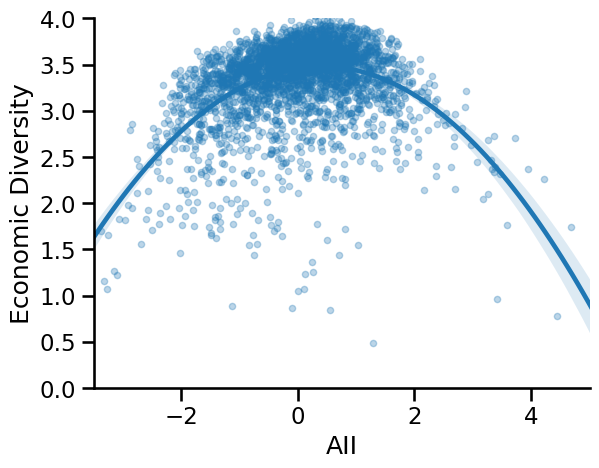

In [126]:
sns.regplot(
    x='aii_scaled',
    y='pk',
    data=pd.merge(
        aigi,
        county_entropy,
        how='left',
        on='area_fips'
    ),
    marker='.',
    scatter_kws=dict(
        alpha=.3
    ),
    order=2,
)
plt.xlim(-3.5, 5)
plt.ylim(0, 4)
plt.xlabel('AII')
plt.ylabel('Economic Diversity')
sns.despine()
plt.savefig('figures/2022/aigi-entropy.pdf', bbox_inches='tight')

In [127]:
threshold = tasks['similarity'].quantile(p_threshold)

def find_most_disrupted_tasks(task_embeddings, abstract_embeddings, tasks, patents):
    assert task_embeddings.shape[0] == tasks.shape[0]
    assert abstract_embeddings.shape[0] == patents.shape[0]

    similarity = cosine_similarity(
        task_embeddings,
        abstract_embeddings
    )

    task_df = tasks.copy()

    patent_map = patents.abstract.reset_index(drop=True).to_dict()
    task_df['similarity'] = similarity.max(axis=1)
    task_df['patent_index'] = similarity.argmax(axis=1)
    task_df['s'] = task_df['similarity'].gt(threshold).astype(int)
    task_df['similarity_t'] = task_df['similarity'] * task_df['s']
    task_df['closest_patent'] = task_df['patent_index'].map(patent_map)
    return task_df

def get_disrupted_tasks_over_time(task_embeddings, abstract_embeddings, tasks, patents, task_ids):
    task_df = pd.DataFrame()
    for year in range(2015, 2021):
        patent_ids = patents[patents['year'].ge(year) & patents['year'].le(year)].index.values
        task_df = pd.concat([
            task_df,
            find_most_disrupted_tasks(
                task_embeddings[task_ids],
                abstract_embeddings[patent_ids],
                tasks.loc[task_ids],
                patents.loc[patent_ids]
            ).assign(year=year)
        ], ignore_index=True)
    return task_df

# Education

In [128]:
edu = pd.read_csv('datasets/db_26_3_text/Education, Training, and Experience.txt', sep='\t')
edu_categories = pd.read_csv('datasets/db_26_3_text/Education, Training, and Experience Categories.txt', sep='\t')

In [129]:
edu_rl = edu.query('`Scale ID` == "RL"').copy()

In [130]:
edu_rl['exp_edu'] = edu_rl['Category'] * edu_rl['Data Value'] / 100

In [131]:
# edu_level = edu_rl.groupby('Title').exp_edu.sum()
edu_level = edu_rl.sort_values(['O*NET-SOC Code', 'Data Value']).groupby('O*NET-SOC Code').tail(1).set_index('O*NET-SOC Code')[['Category']]
edu_level['exp_edu'] = edu_level['Category']
edu_level = edu_level.reset_index()
edu_level['SOC Code'] = edu_level['O*NET-SOC Code'].str[:7]
edu_level = edu_level.groupby(['SOC Code', 'Category']).agg({'exp_edu': 'mean'}).reset_index()

In [132]:
edu_rl['exp_edu'] = edu_rl['Category'] * edu_rl['Data Value']

In [133]:
edu_level = (
    pl.from_dataframe(edu_rl)
    .filter(pl.col('Data Value') == pl.col('Data Value').max().over('O*NET-SOC Code'))
    .select('O*NET-SOC Code', pl.col('Category').alias('exp_edu'))
    .to_pandas()
)
edu_level['SOC Code'] = edu_level['O*NET-SOC Code'].str[:7]
edu_level = edu_level.groupby('SOC Code').exp_edu.max().reset_index()

In [134]:
edu_level = (edu_rl.groupby('O*NET-SOC Code').agg({'exp_edu': 'sum'}) / 100).reset_index()
edu_level['SOC Code'] = edu_level['O*NET-SOC Code'].str[:7]
edu_level = edu_level.groupby('SOC Code').exp_edu.mean().reset_index()
edu_level['edu_group'] = pd.cut(edu_level['exp_edu'], [0, 1, 3, 5, 7, 13]).cat.codes

In [135]:
ai_edu = pd.merge(
    data,
    edu_level,
    how='left',
    on='SOC Code'
)

In [136]:
ai_edu['edu_group'].value_counts()

edu_group
1.0    292
2.0    166
3.0    137
4.0    128
Name: count, dtype: int64

In [137]:
sns.set_context('talk')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



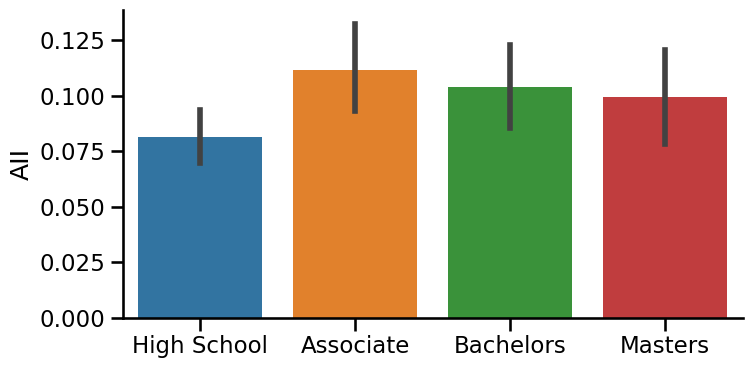

In [138]:
# Figure 1
fig, ax = plt.subplots(figsize=(8, 4))
sns.barplot(
    x='edu_group',
    y='aii',
    data=ai_edu
)
plt.xticks(range(4), ['High School', 'Associate', 'Bachelors', 'Masters'])
plt.xlabel('')
plt.ylabel('AII')
sns.despine()
plt.savefig('figures/2022/education.pdf', bbox_inches='tight')

In [532]:
ai_edu[['aii', 'exp_edu']].corr()

,aii,exp_edu
aii,1.000000,0.061686
exp_edu,0.061686,1.000000


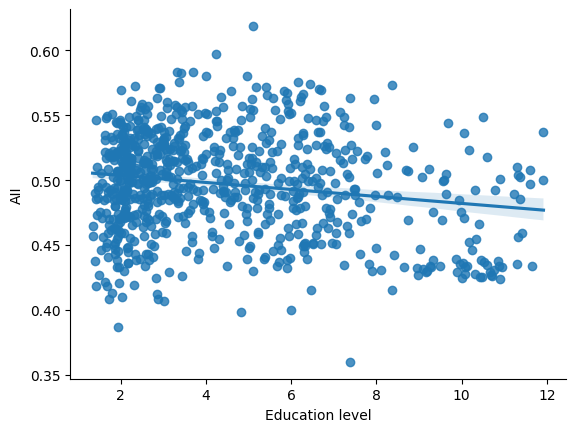

In [ ]:
sns.regplot(
    x='exp_edu',
    y='aii',
    data=ai_edu
)
plt.ylabel('AII')
plt.xlabel('Education level')
sns.despine()

In [ ]:
from scipy.stats import pearsonr

pearsonr(*ai_edu[['aii', 'exp_edu']].dropna().values.T)

PearsonRResult(statistic=-0.09587254267721623, pvalue=0.0028419729957793243)